In [1]:
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = True

In [42]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re, nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from wordcloud import WordCloud
import spacy
nlp = spacy.load('en_core_web_sm')
nltk.download('wordnet')
nltk.download('punkt')
from nltk.stem import WordNetLemmatizer
from tqdm import tqdm
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import gensim
from gensim import corpora
from gensim.models.coherencemodel import CoherenceModel
import matplotlib.colors as mcolors
from collections import Counter
from matplotlib.ticker import FuncFormatter
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mohsi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\mohsi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mohsi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [14]:
data = pd.read_csv('papers.csv')
data.head()

,id,year,title,event_type,pdf_name,abstract,paper_text
0,1,1987,Self-Organization of Associative Database and ...,NaN,1-self-organization-of-associative-database-an...,Abstract Missing,767\n\nSELF-ORGANIZATION OF ASSOCIATIVE DATABA...
1,10,1987,A Mean Field Theory of Layer IV of Visual Cort...,NaN,10-a-mean-field-theory-of-layer-iv-of-visual-c...,Abstract Missing,683\n\nA MEAN FIELD THEORY OF LAYER IV OF VISU...
2,100,1988,Storing Covariance by the Associative Long-Ter...,NaN,100-storing-covariance-by-the-associative-long...,Abstract Missing,394\n\nSTORING COVARIANCE BY THE ASSOCIATIVE\n...
3,1000,1994,Bayesian Query Construction for Neural Network...,NaN,1000-bayesian-query-construction-for-neural-ne...,Abstract Missing,Bayesian Query Construction for Neural\nNetwor...
4,1001,1994,"Neural Network Ensembles, Cross Validation, an...",NaN,1001-neural-network-ensembles-cross-validation...,Abstract Missing,"Neural Network Ensembles, Cross\nValidation, a..."


In [15]:
print(data.columns)
print(len(data.columns))

Index(['id', 'year', 'title', 'event_type', 'pdf_name', 'abstract',
       'paper_text'],
      dtype='object')
7


In [16]:
data.shape

(7241, 7)

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7241 entries, 0 to 7240
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          7241 non-null   int64 
 1   year        7241 non-null   int64 
 2   title       7241 non-null   object
 3   event_type  2422 non-null   object
 4   pdf_name    7241 non-null   object
 5   abstract    7241 non-null   object
 6   paper_text  7241 non-null   object
dtypes: int64(2), object(5)
memory usage: 396.1+ KB


In [18]:
data.isnull().sum()

id               0
year             0
title            0
event_type    4819
pdf_name         0
abstract         0
paper_text       0
dtype: int64

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\3984420000.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.catplot(data=data, x='year', kind='count', height=4.5, aspect=2.5, palette='hls')


<Figure size 1200x600 with 0 Axes>

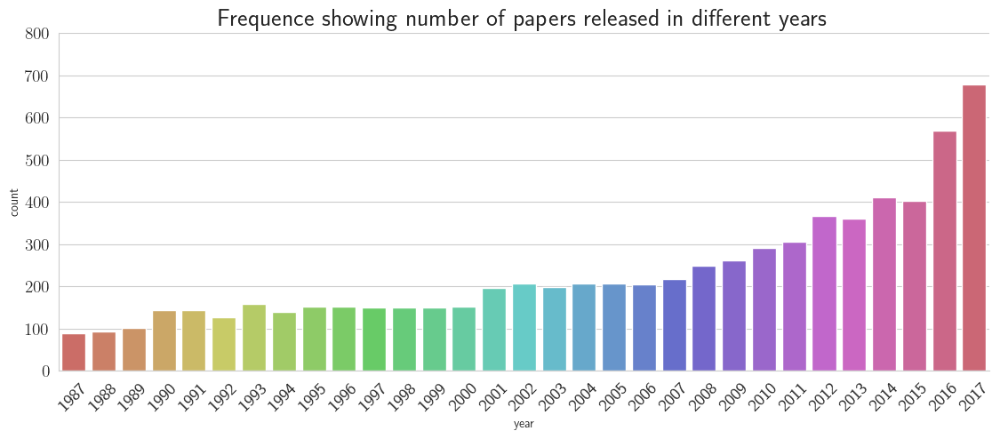

In [19]:
sns.set_style("whitegrid")
plt.figure(figsize=(12,6))
graph = sns.catplot(data=data, x='year', kind='count', height=4.5, aspect=2.5, palette='hls')
graph.set_xticklabels(rotation=45, fontsize=14)
graph.set_yticklabels(fontsize=14)
plt.title("Frequence showing number of papers released in different years", size = 20)
plt.savefig("yo.pdf", bbox_inches='tight', format='pdf')

In [20]:
pd.set_option('display.max_colwidth', None)
data['paper_text'].head()

0    767\n\nSELF-ORGANIZATION OF ASSOCIATIVE DATABASE\nAND ITS APPLICATIONS\nHisashi Suzuki and Suguru Arimoto\nOsaka University, Toyonaka, Osaka 560, Japan\nABSTRACT\nAn efficient method of self-organizing associative databases is proposed together with\napplications to robot eyesight systems. The proposed databases can associate any input\nwith some output. In the first half part of discussion, an algorithm of self-organization is\nproposed. From an aspect of hardware, it produces a new style of neural network. In the\nlatter half part, an applicability to handwritten letter recognition and that to an autonomous\nmobile robot system are demonstrated.\n\nINTRODUCTION\nLet a mapping f : X -+ Y be given. Here, X is a finite or infinite set, and Y is another\nfinite or infinite set. A learning machine observes any set of pairs (x, y) sampled randomly\nfrom X x Y. (X x Y means the Cartesian product of X and Y.) And, it computes some\nestimate j : X -+ Y of f to make small, the estimation 

In [21]:
# Word-size histogram before cleaning text

data['Number_of_words'] = data['paper_text'].apply(lambda x: len(str(x).split()))

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\3782711716.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Number_of_words'], kde=False, color='blue', bins=100)


Text(0.5, 1.0, 'Frequency distribution of number of words for each text extracted')

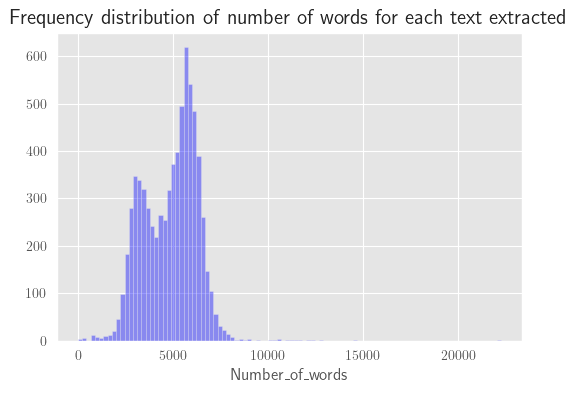

In [22]:
plt.style.use('ggplot')
plt.figure(figsize=(6, 4))
sns.distplot(data['Number_of_words'], kde=False, color='blue', bins=100)
plt.title("Frequency distribution of number of words for each text extracted", size=15)

Text(0.5, 1.0, 'Word frequence distribution using Box plot')

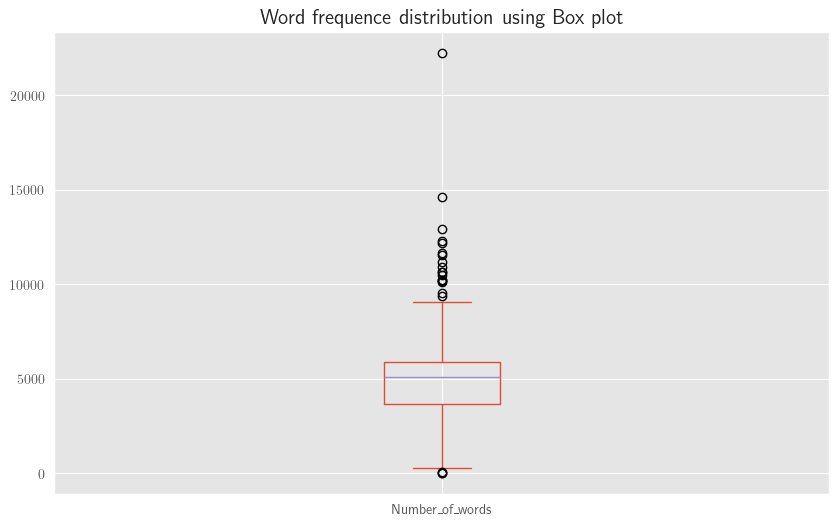

In [23]:
plt.figure(figsize=(10, 6))
data['Number_of_words'].plot(kind='box')
plt.title("Word frequence distribution using Box plot", size=15)

In [24]:
data.drop(data[data["Number_of_words"] < 200].index, inplace=True)

In [25]:
data.shape

(7238, 8)

In [26]:
len(data[(data['Number_of_words'] > 200) & (data['Number_of_words'] < 500)])

6

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\4245166478.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Number_of_words'], kde=False, color='cyan', bins=100)


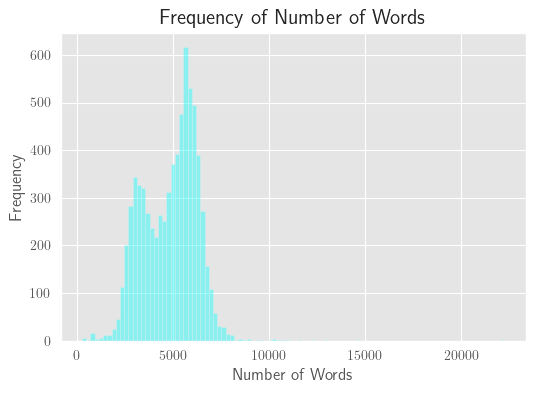

In [27]:
plt.style.use('ggplot')
plt.figure(figsize=(6, 4))
sns.distplot(data['Number_of_words'], kde=False, color='cyan', bins=100)
plt.title("Frequency of Number of Words", size=15)
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()

In [28]:
#text clean function
def cleaned_text(text):
    clean = re.sub("\n"," ",text)
    clean=clean.lower()
    clean=re.sub(r"[~.,%/:;?_&+*=!-]"," ",clean)
    clean=re.sub("[^a-z]"," ",clean)
    clean=clean.lstrip()
    clean=re.sub("\s{2,}"," ",clean)
    return clean

data['cleaned_paper_text'] = data['paper_text'].apply(cleaned_text)

In [29]:
data['cleaned_paper_text'] = data['cleaned_paper_text'].apply(lambda x: ' ' .join([word for word in x.split() if len(word) > 3]))

In [30]:
type(data['cleaned_paper_text'].head(10))

pandas.core.series.Series

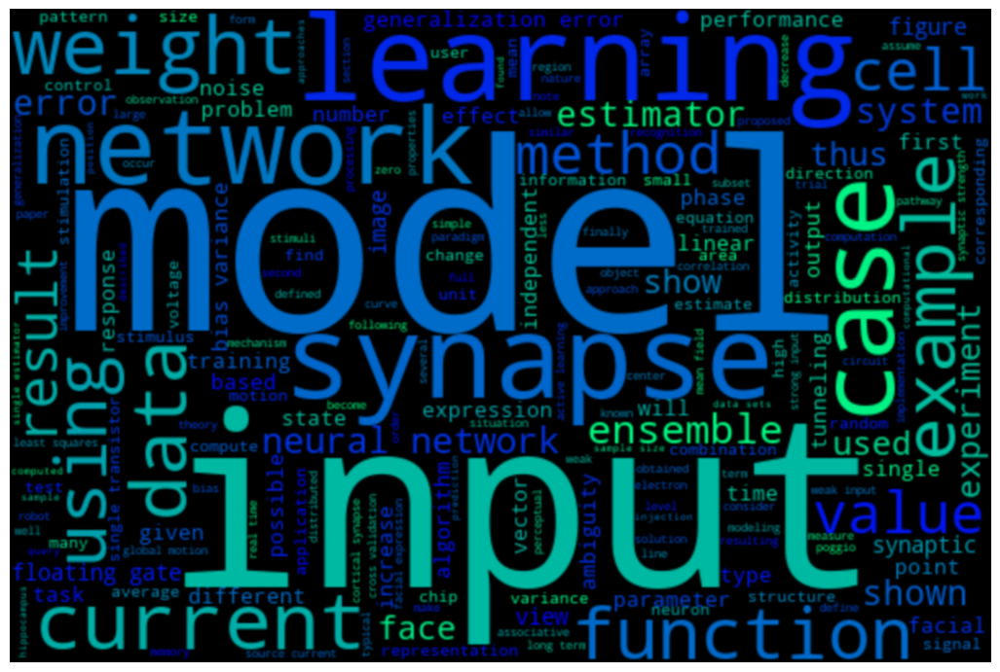

In [31]:
cloud = WordCloud(colormap='winter', width=600, height=400).generate(str(data['cleaned_paper_text']))
fig = plt.figure(figsize=(13, 18))
plt.axis('off')
plt.imshow(cloud, interpolation='bicubic')

In [32]:
# Text Cleaning (Stopword removal and lemmatization)

stop = stopwords.words('english')
stop.append("also")
data['stop_removed_paper_text'] = data['cleaned_paper_text'].apply(lambda x: ' '. join([word for word in x.split() if word not in stop]))

In [33]:
data["tokenized"] = data['stop_removed_paper_text'].apply(lambda x: nltk.word_tokenize(x))

In [34]:
def word_lemmatizer(text):
  lem_text = [WordNetLemmatizer().lemmatize(i, pos='v') for i in text]
  return lem_text

data['lemmatized'] = data['tokenized'].apply(lambda x: word_lemmatizer(x))
data['lemmatize_joined'] = data['lemmatized'].apply(lambda x: ' '. join(x))

In [35]:
data['Number_of_words_for_cleaned'] = data['lemmatize_joined'].apply(lambda x:len(str(x).split()))

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\4205994924.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Number_of_words_for_cleaned'],kde = False, color= "navy", bins = 100)


Text(0.5, 1.0, 'Frequency distribution of number of words for each text extracted after removing stopwords and lemmatization')

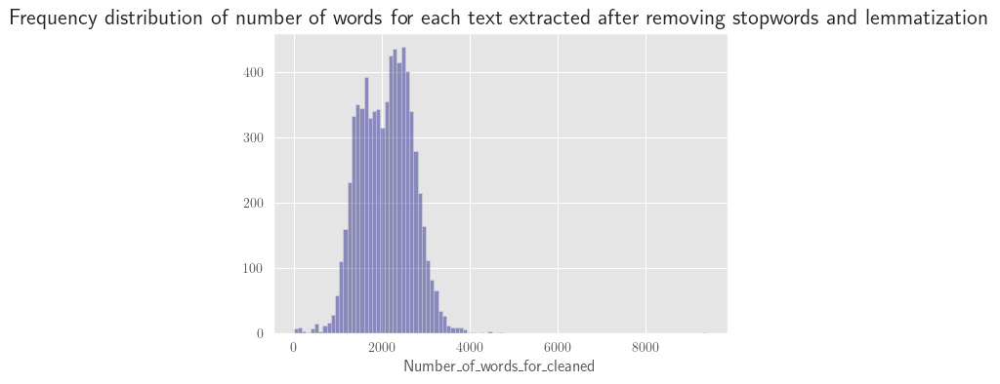

In [36]:
plt.style.use('ggplot')
plt.figure(figsize=(6, 4))
sns.distplot(data['Number_of_words_for_cleaned'],kde = False, color= "navy", bins = 100)
plt.title("Frequency distribution of number of words for each text extracted after removing stopwords and lemmatization", size=16)

In [37]:
data.drop(data[data["Number_of_words_for_cleaned"]>4500].index, inplace = True)

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\2617961542.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Number_of_words_for_cleaned'],kde = False, color= "orangered", bins = 100)


Text(0.5, 1.0, 'Frequency distribution of no of words in the documents after removing docs containing > 4500 words')

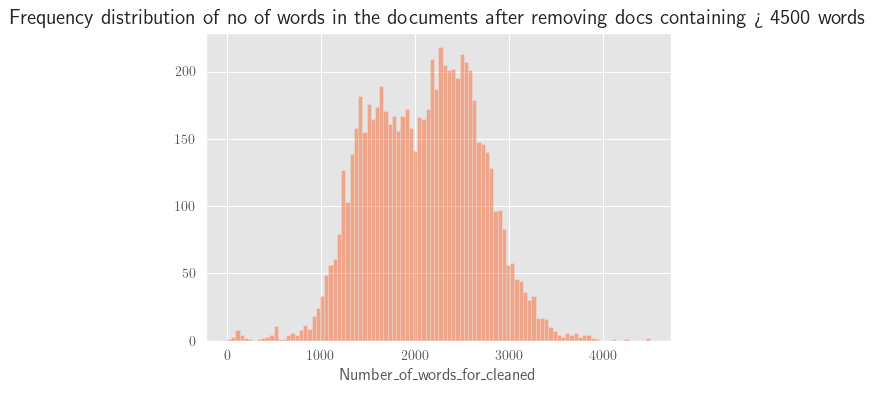

In [38]:
plt.style.use('ggplot')
plt.figure(figsize=(6, 4))
sns.distplot(data['Number_of_words_for_cleaned'],kde = False, color= "orangered", bins = 100)
plt.title("Frequency distribution of no of words in the documents after removing docs containing > 4500 words", size=15)

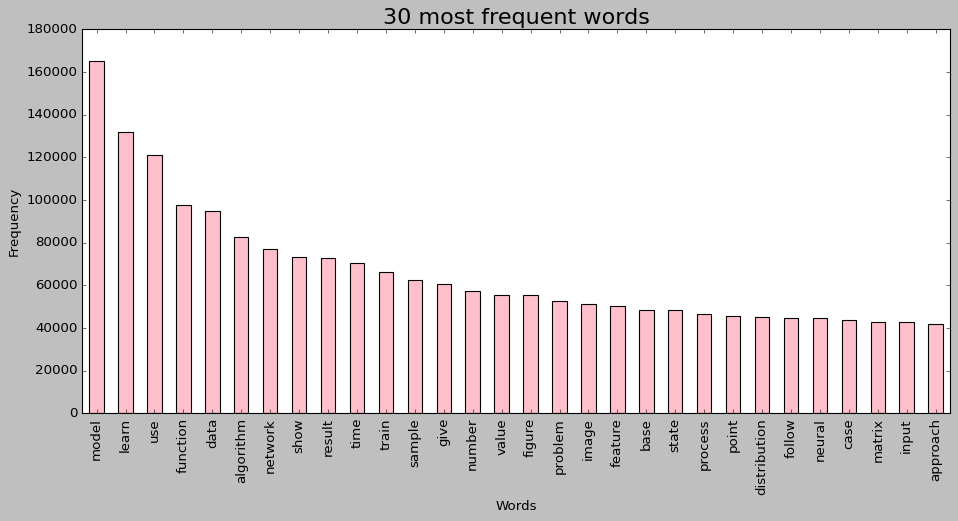

In [39]:
plt.style.use('classic')
plt.figure(figsize=(14,6))
freq = pd.Series(" ".join(data["lemmatize_joined"]).split()).value_counts()[:30]
freq.plot(kind = "bar", color = "pink")
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("30 most frequent words",size=20)
plt.savefig('yo.pdf', bbox_inches='tight', format='pdf')

In [40]:
tokens = data['lemmatize_joined'].apply(lambda x: nltk.word_tokenize(x))

In [43]:
w2v_model = Word2Vec(tokens,
                     min_count=600,
                     window=10,
                     vector_size=250,
                     alpha=0.03,
                     min_alpha=0.0007,
                     workers=4,
                     seed=42)

In [44]:
v1 = w2v_model.wv['model']
v1.size

250

In [45]:
sim_words = w2v_model.wv.most_similar('estimator')
sim_words

[('estimators', 0.7468743324279785),
 ('unbiased', 0.5588369369506836),
 ('estimate', 0.5565434098243713),
 ('asymptotically', 0.4714966416358948),
 ('estimation', 0.4588533639907837),
 ('plug', 0.4258286654949188),
 ('asymptotic', 0.4160492420196533),
 ('statistic', 0.4085504114627838),
 ('density', 0.3885669708251953),
 ('variance', 0.38092878460884094)]

c:\Users\mohsi\OneDrive\Desktop\LDA+W2C\tmd\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


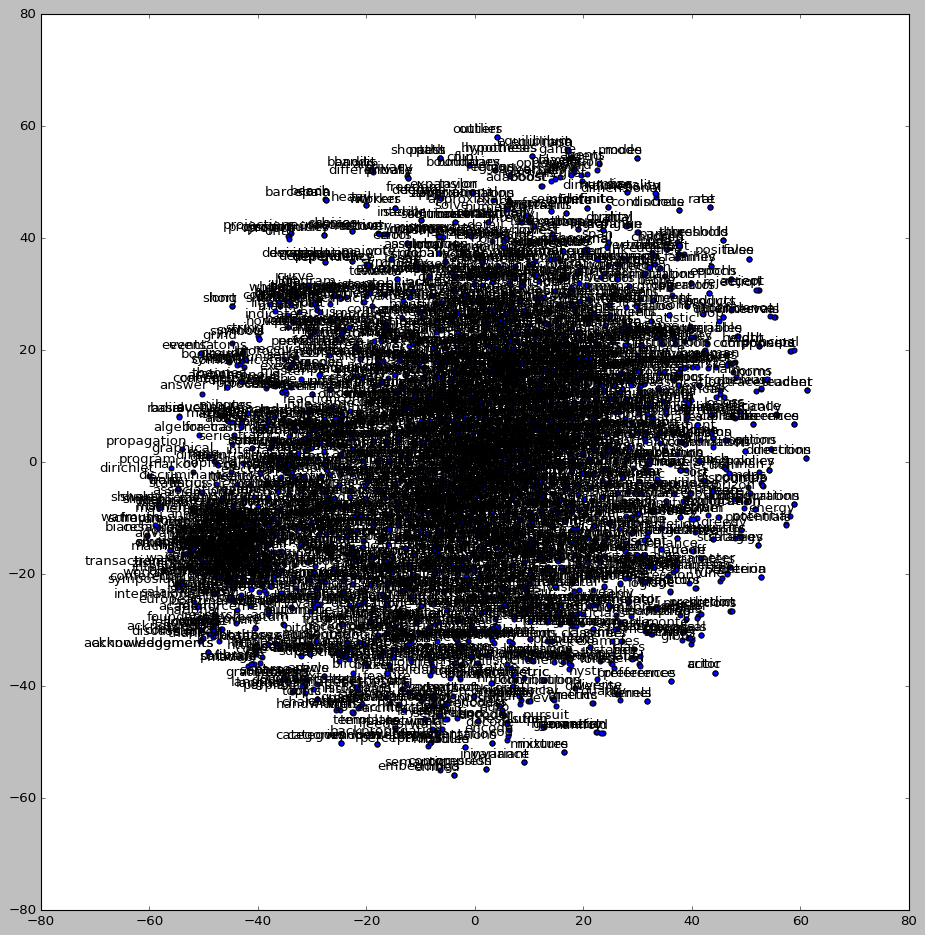

In [46]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)

    # Convert tokens list to a NumPy array
    tokens = np.array(tokens)

    tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=2000, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []

    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(14, 14))

    for i in range(len(x)):
        plt.scatter(x[i], y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

tsne_plot(w2v_model)

In [47]:
w2v_model_2 = Word2Vec(tokens,
                     min_count=1000,
                     window=10,
                     vector_size=250,
                     alpha=0.03,
                     min_alpha=0.0007,
                     workers = 4,
                     seed=50)

c:\Users\mohsi\OneDrive\Desktop\LDA+W2C\tmd\lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


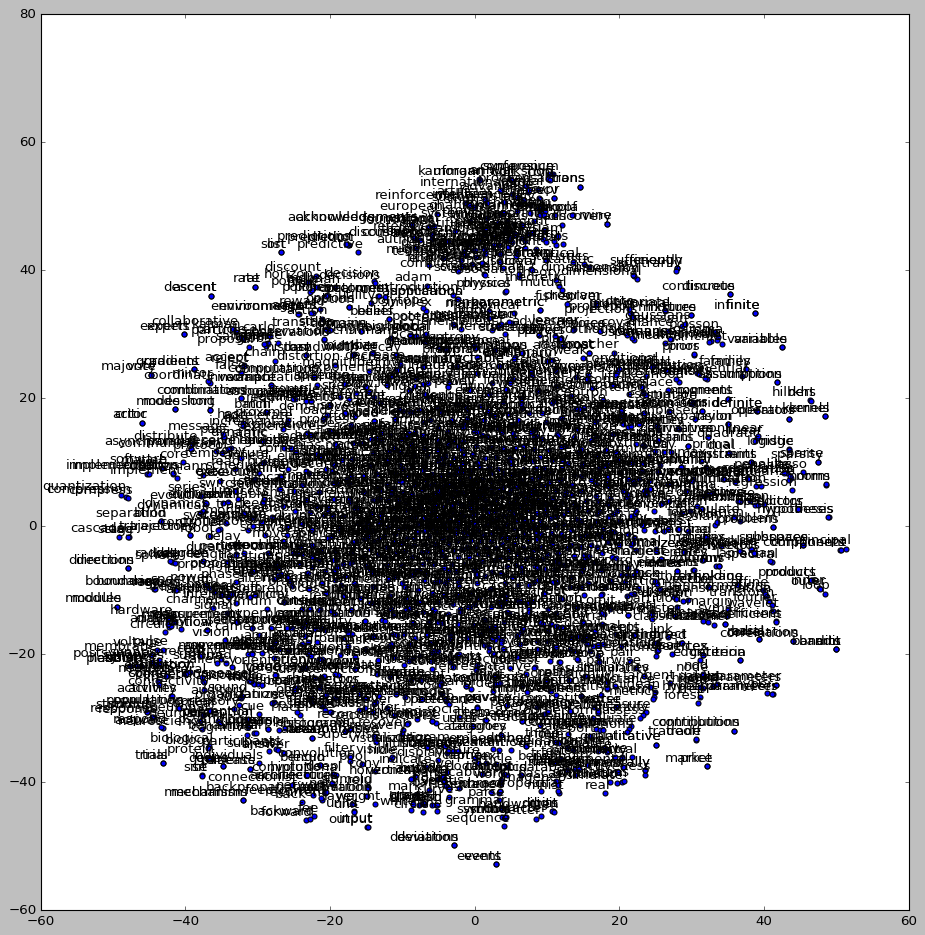

In [48]:
tsne_plot(w2v_model_2)

In [49]:
# topic modelling using LDA

dictionary = corpora.Dictionary(data["lemmatized"])
doc_term_matrix = [dictionary.doc2bow(rev) for rev in data["lemmatized"]]

In [50]:
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 6),
  (6, 2),
  (7, 3),
  (8, 1),
  (9, 2),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 2),
  (14, 8),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 6),
  (26, 2),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 2),
  (31, 3),
  (32, 3),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 2),
  (38, 7),
  (39, 1),
  (40, 1),
  (41, 3),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 13),
  (50, 5),
  (51, 1),
  (52, 3),
  (53, 2),
  (54, 1),
  (55, 4),
  (56, 5),
  (57, 4),
  (58, 3),
  (59, 1),
  (60, 4),
  (61, 4),
  (62, 1),
  (63, 3),
  (64, 1),
  (65, 3),
  (66, 9),
  (67, 1),
  (68, 2),
  (69, 6),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 3),
  (76, 1),
  (77, 1),
  (78, 3),
  (79, 11),
  (80, 1),
  (81, 1),
  (82, 3),
  (83, 1),
  (84, 1),
  (85, 7),
  (86, 1),
  (87, 1),
  (88, 1),
  (89, 4),
  (90, 1),
  (91, 

In [51]:
LDA = gensim.models.ldamodel.LdaModel

#Build LDA Model
lda_model = LDA(corpus=doc_term_matrix, id2word=dictionary, num_topics=4, random_state=100, chunksize=200, passes=100)

In [55]:
lda_model.print_topics()

[(0,
  '0.020*"network" + 0.013*"model" + 0.011*"neural" + 0.010*"input" + 0.009*"time" + 0.008*"learn" + 0.007*"figure" + 0.007*"state" + 0.006*"use" + 0.006*"output"'),
 (1,
  '0.013*"model" + 0.011*"data" + 0.008*"sample" + 0.008*"matrix" + 0.008*"use" + 0.006*"function" + 0.006*"algorithm" + 0.006*"distribution" + 0.005*"cluster" + 0.005*"result"'),
 (2,
  '0.016*"model" + 0.015*"learn" + 0.014*"train" + 0.013*"image" + 0.011*"use" + 0.010*"feature" + 0.010*"network" + 0.007*"data" + 0.006*"layer" + 0.006*"task"'),
 (3,
  '0.013*"learn" + 0.013*"algorithm" + 0.012*"function" + 0.006*"problem" + 0.006*"use" + 0.006*"value" + 0.006*"result" + 0.005*"algorithms" + 0.005*"state" + 0.005*"time"')]

In [56]:
# checking coherence of the topics identified by LDA model

coherence_model_lda = CoherenceModel(model=lda_model, texts=data['lemmatized'], dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()

In [57]:
coherence_lda # in the scale of 0 - 1, we got a coherence score of ~0.37, which is not good, it can be improved by hyperparameter tweaking

0.3646264534789321

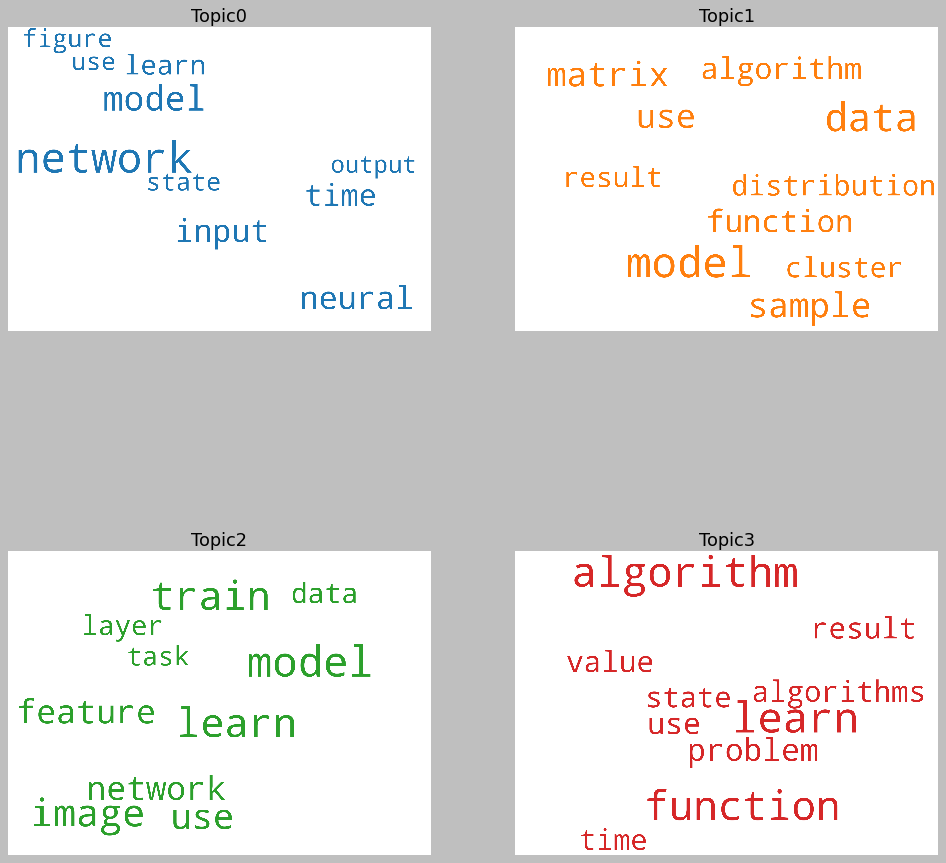

In [64]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)
fig, axes = plt.subplots(2, 2, figsize=(15,15), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=250)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')

In [68]:
def format_topics_sentences(ldamodel=None, corpus=None, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                # sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
                sent_topics_df = pd.concat([sent_topics_df, pd.DataFrame([[int(topic_num), round(prop_topic, 4), topic_keywords]])], ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=doc_term_matrix, texts=data["lemmatized"])

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.3609,"network, model, neural, input, time, learn, figure, state, use, output","[self, organization, associative, database, applications, hisashi, suzuki, suguru, arimoto, osaka, university, toyonaka, osaka, japan, abstract, efficient, method, self, organize, associative, databases, propose, together, applications, robot, eyesight, systems, propose, databases, associate, input, output, first, half, part, discussion, algorithm, self, organization, propose, aspect, hardware, produce, style, neural, network, latter, half, part, applicability, handwritten, letter, recognition, autonomous, mobile, robot, system, demonstrate, introduction, map, give, finite, infinite, another, finite, infinite, learn, machine, observe, pair, sample, randomly, mean, cartesian, product, compute, estimate, make, small, estimation, error, measure, usually, faster, decrease, estimation, error, increase, number, sample, better, learn, machine, however, expression, performance, incomplete, since, lack, consideration, ...]"
1,1,0.0,0.9625,"network, model, neural, input, time, learn, figure, state, use, output","[mean, field, theory, layer, visual, cortex, application, artificial, neural, network, christopher, scofield, center, neural, science, physics, department, brown, university, providence, rhode, island, nestor, richmond, square, providence, rhode, island, abstract, single, cell, theory, development, selectivity, ocular, dominance, visual, cortex, present, previously, bienenstock, cooper, munrol, extend, network, applicable, layer, visual, cortex, paper, present, mean, field, approximation, capture, fairly, transparent, manner, qualitative, many, quantitative, result, network, theory, finally, consider, application, theory, artificial, neural, network, show, significant, reduction, architectural, complexity, possible, single, layer, network, mean, field, approximation, consider, single, layer, network, ideal, neurons, receive, signal, outside, layer, cells, within, layer, figure, activity, cell, network, ...]"
2,2,0.0,0.9954,"network, model, neural, input, time, learn, figure, state, use, output","[store, covariance, associative, long, term, potentiation, depression, synaptic, strengths, hippocampus, patric, stanton, terrence, sejnowski, department, biophysics, johns, hopkins, university, baltimore, abstract, model, study, memory, base, neural, network, selective, enhancement, depression, synaptic, strengths, require, effident, storage, inrormation, sejnowski, kohonen, bienenstock, sejnowski, tesauro, test, assumption, hippocampus, cortical, structure, brain, involve, long, term, memory, brier, high, frequency, activation, excitatory, synapses, hippocampus, produce, increase, synaptic, strength, know, long, term, potentiation, bus, lomo, last, many, days, know, hebbian, since, require, simultaneous, release, neurotransmitter, presynaptic, terminals, couple, postsynaptic, depolarization, kelso, malinow, miller, gustatrson, however, mechanism, persistent, reduction, synaptic, strength, could, balance, demonstrate, study, associative, interactions, separate, ...]"
3,3,1.0,0.4538,"model, data, sample, matrix, use, function, algorithm, distribution, cluster, result","[bayesian, query, construction, neural, network, model, gerhard, paass, jorg, kindermann, german, national, research, center, computer, science, sankt, augustin, germany, paass, kindermann, abstract, data, collection, costly, much, gain, actively, select, particularly, informative, data, point, sequential, bayesian, decision, theoretic, framework, develop, query, selection, criterion, explicitly, take, account, intend, model, predictions, markov, chain, monte, carlo, methods, necessary, quantities, approximate, desire, precision, number, data, point, grow, model, complexity, modify, bayesian, model, selection, strategy, properties, versions, criterion, demonstrate, numerical, experiment, introduction, paper, consider, situati

C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\1412591291.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\1412591291.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\1412591291.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
C:\Users\mohsi\AppData\Local\Temp\ipykernel_18536\1412591291.py:23: UserWarning: set_ticklabels() should only be used with a

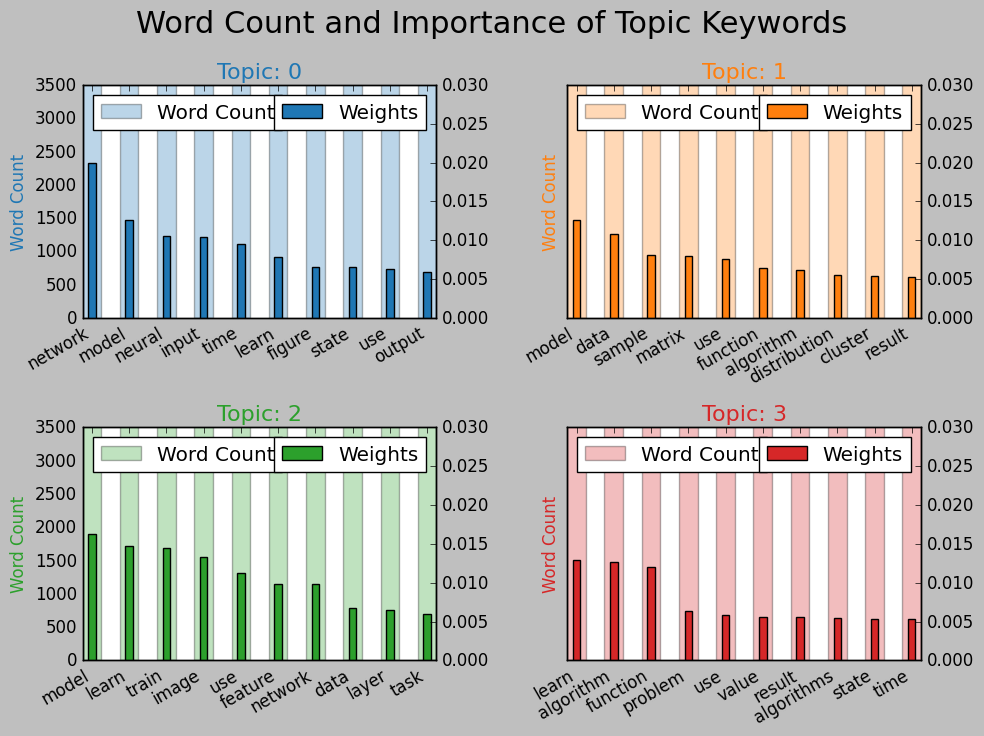

In [69]:
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data["lemmatized"] for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(10,7), sharey=True, dpi=100)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

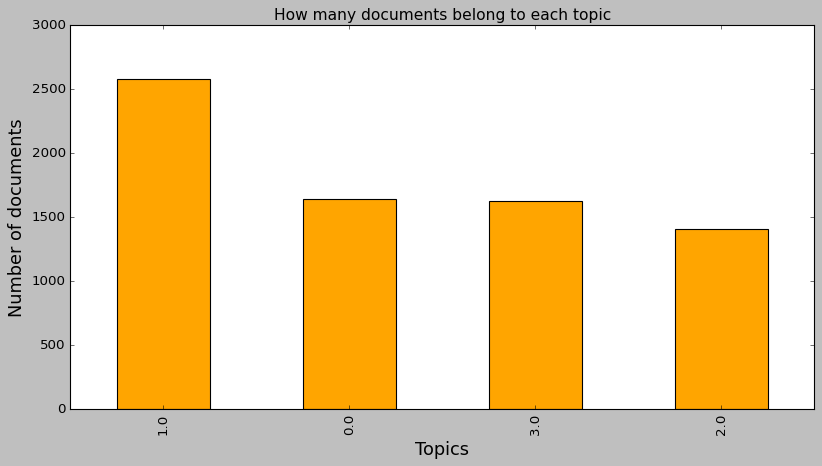

In [71]:
import matplotlib.pyplot as plt

# Checking the number of documents that belong to each topic (dominant topic) visually
topic_counts = df_dominant_topic['Dominant_Topic'].value_counts()

# Create a figure and axis
plt.figure(figsize=(12, 6))
topic_counts.plot(kind='bar', color='orange')

# Add titles and labels
plt.title("How many documents belong to each topic", size=14)
plt.xlabel("Topics", size=16)
plt.ylabel("Number of documents", size=16)

# Show the plot
plt.show()
